## Генерация изображений в Stable Diffusion

Чтобы сгенерировать картинки, необходимо прокликать все испольняемые ячейки сверху вниз, поскольку следующие по тексту ячейки зависят от предыдущих.

Для начала, установим все библиотеки:


In [6]:
10*2

20

In [7]:
!pip install diffusers==0.2.4
!pip install transformers scipy ftfy
!pip install "ipywidgets>=7,<8"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 112 kB 31.5 MB/s 
     |████████████████████████████████| 182 kB 58.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.5 MB 30.1 MB/s 
     |████████████████████████████████| 53 kB 1.4 MB/s 
     |████████████████████████████████| 7.6 MB 50.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 34.2 MB/s 


Для использования модели Stable Diffusion вам нужно:

1. Зарегистрироваться на портале [HuggingFace.co](http://HuggingFace.co) и войти (Log In).
2. На страничке [Stable Diffusion](https://huggingface.co/CompVis/stable-diffusion-v1-4) согласиться с условиями использования. Кстати, эти условия [стоит прочитать](https://huggingface.co/spaces/CompVis/stable-diffusion-license).
3. На [своей страничке настроек](https://huggingface.co/settings/tokens) необходимо скопировать токен доступа (Access Token)

После этого прокликиваем ячейки ниже и вводим свой Access Token, когда попросят.


In [8]:
from google.colab import output
output.enable_custom_widget_manager()

In [11]:
from huggingface_hub import notebook_login

notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.huggingface/token
Login successful


Теперь загружаем модель Stable Diffusion:

In [12]:
import torch
from diffusers import StableDiffusionPipeline

# make sure you're logged in with `huggingface-cli login`
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16, use_auth_token=True)  
pipe = pipe.to("cuda")

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/1.34k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/572 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/71.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

Далее определяем вспомогательную функцию для отображения нескольких изображений:

In [13]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

### Генерация трех изображений

В коде ниже измените запрос по своему усмотрению. Можете раскомментаривать строчки, определяющие height и width, для получения изображений различных форматов. Данный запрос сгенерирует три изображения по запросу - больше пробовать не стоит, т.к. скорее всего не хватит памяти GPU.

0it [00:00, ?it/s]

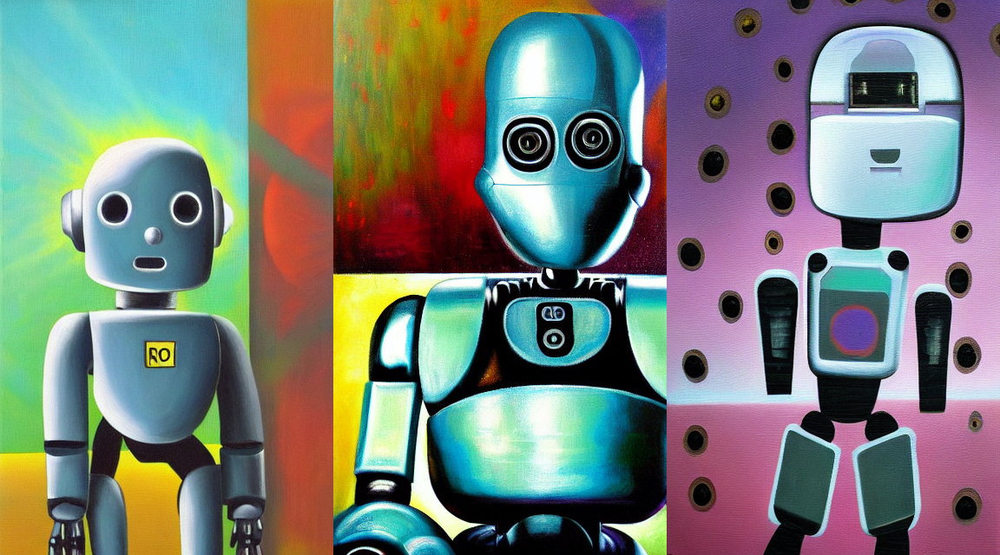

In [14]:
from torch import autocast 
num_images = 3

# Square
#height,width = 512,512

# Portrait
height,width = (16+64)*8, (16+32)*8

# Landscape
#height,width = (32+16)*8, (64+32)*8

prompt = ["Do robots dream oil canvas"] * num_images

with autocast("cuda"):
  images = pipe(prompt,height=height,width=width)["sample"] # horizontal

grid = image_grid(images, rows=1, cols=3)
grid

### Сохраняем результаты на диск Colab для скачивания

Мы можем сохранить результаты на диск Google Colab, и потом загрузить их единым архивом. Однако в случае, если произойдёт timeout из-за неактивности, а также после завершения работы сессии Colab, все сгенерированные результаты будут потеряны. Поэтому их необходимо своевременно скачивать!

Следующая ячейка сохраняет картинки. Можно генерировать и сохранять много картинок на диск, и потом уже выполнять следующие ячейки для их архивации.

In [15]:
for i,im in enumerate(images):
   im.save(f"{prompt[0].replace(' ','_')}_{i}.png")

Следующая ячейка запаковывает все картинки в единый архив, который можно затем скачать. Также вы можете раскомментарить код, который удалит картинки после скачивания. После выполнения ячейки - зайдите в панель файлов и скачайте pics.zip к себе на компьютер.

In [16]:
!zip pics.zip *.png
!rm *.png

  adding: Do_robots_dream_oil_canvas_0.png (deflated 0%)
  adding: Do_robots_dream_oil_canvas_1.png (deflated 0%)
  adding: Do_robots_dream_oil_canvas_2.png (deflated 0%)


### Сохраняем результаты на Google Drive

Вы также можете подключить свой Google Drive, и сохранять результаты прямо туда. В этом случае они не будут потеряны в случае приостановки сессии Colab. Следующую ячейку с кодом для подключения необходимо выполнить только один раз. Впоследствии выполняйте только код для сохранения файлов.

In [17]:
# Подключаем Google Drive

from google.colab import drive
!mkdir content
drive.mount('/content/drive')

# Создаём директорию для картинок
!mkdir /content/drive/MyDrive/NeuroArt

mkdir: cannot create directory ‘content’: File exists
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
mkdir: cannot create directory ‘/content/drive/MyDrive/NeuroArt’: File exists


Следующая ячейка записывает файлы на Google Drive. Для генерации большого числа изображений выполняйте ячейку выше для генерации картинок, и затем эту ячейку для сохранения их на Google Drive

In [18]:
for i,im in enumerate(images):
   im.save(f"drive/MyDrive/NeuroArt/{prompt[0].replace(' ','_')}_{i}.png")


### Генерируем много изображений сразу

Мы также можем сгенерировать сразу много изображений, комбинируя, например, разные стили. В этом коде `prompt` определяет основной запрос, а `style` - стилевую часть запроса. Формат изображения определяется переменными `height` и `width`.

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

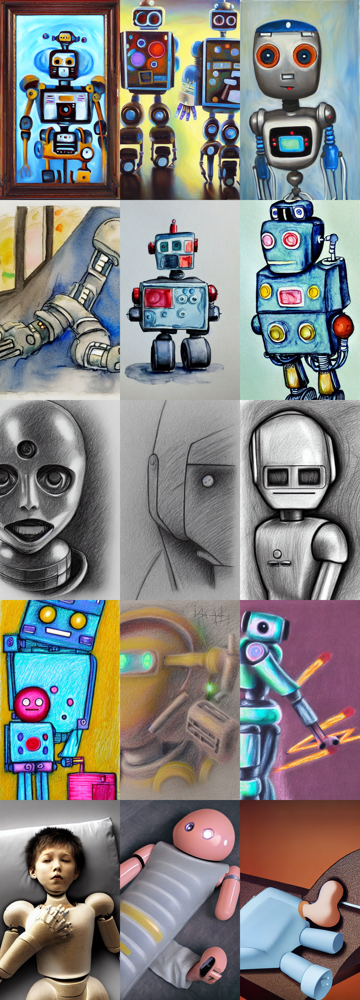

In [19]:
from torch import autocast

style = ["oil painting","watercolor drawing","pencil sketch","pastel drawing",'hyper realistic photo']
prompt = "Do robots really dream like human"

num_rows = len(style)
num_cols = 3

#height,width = 512,512 # square
height,width = (16+64)*8, (16+32)*8 # portrait
#height,width = (32+16)*8, (64+32)*8 # landscape

all_images = []
all_prompts = []
for i in range(num_rows):
  with autocast("cuda"):
    xprompt = [f"{style[i]} {prompt}"]*num_cols
    images = pipe(xprompt,width=width,height=height)["sample"]
  all_images.extend(images)
  all_prompts.extend(xprompt)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

Сохраняем результаты (раскомментарьте строчку для Google Drive):

In [20]:
for i,(img,p) in enumerate(zip(all_images,all_prompts)):
  img.save(f"{p.replace(' ','_')}_{i}.png") # Local Drive
  img.save(f"drive/MyDrive/NeuroArt/{p.replace(' ','_')}_{i}.png") # Google Drive 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')